Data Visualization Analysis - Author Feature Analysis

In [1]:
import pandas as pd
import numpy as np

from pyecharts.charts import *
from pyecharts import options as opts

Drawing function encapsulation

In [2]:
def line_chart(t, data):
    chart = (
        Line(init_opts = opts.InitOpts(theme='dark', width='600px', height='450px'))
        .add_xaxis([i[0] for i in data])
        .add_yaxis(
            '',
            [i[1] for i in data],
            is_symbol_show=False,
            areastyle_opts=opts.AreaStyleOpts(opacity=1, color="cyan")
        )
        .set_global_opts(
            title_opts=opts.TitleOpts(title=t),
            xaxis_opts=opts.AxisOpts(type_="category", boundary_gap=True),
            yaxis_opts=opts.AxisOpts(
                type_="value",
                axistick_opts=opts.AxisTickOpts(is_show=True),
                splitline_opts=opts.SplitLineOpts(is_show=True),
            ),
        )
    )
    return chart

In [3]:
def pie_chart(t, data_pair):
    #Create a new pie chart
    chart = (
        Pie(init_opts=opts.InitOpts(theme='dark', width='600px', height='400px'))
        .add('', data_pair ,radius=["30%", "45%"], #Radius range, inner and outer diameters
            label_opts=opts.LabelOpts(formatter="{b}: {d}%") #Label setting, {d} represents display percentage
        )
        .set_global_opts(
            title_opts=opts.TitleOpts(
                title=t
             ),
            legend_opts=opts.LegendOpts(pos_left="0%",pos_top="55",orient='vertical')
        )
    )
    return chart

2.1 Data indicator statistics

In [4]:
author_df = pd.read_csv('author_characteristics.csv')
author_df.head()

,author_id,Total_views,Total_likes,Total_complete_views,Total_number_of_works,Average_duration_of_works,Number_of_background_music_used,Number_of_days_since_the_publication_of_the_work,Creative_activity_(daily),Number_of_cities_visited,City_where_the_author_is_located
0,0,1,0,0,1,10.000000,1,1,1,1,205.0
1,1,16,0,8,3,8.333333,3,3,9,1,165.0
2,3,311,3,203,1,9.000000,1,1,1,1,22.0
3,5,1054,33,485,5,8.200000,4,5,28,1,261.0
4,8,4,0,3,1,19.000000,1,1,1,1,13.0


2.2 Author's permanent city distribution

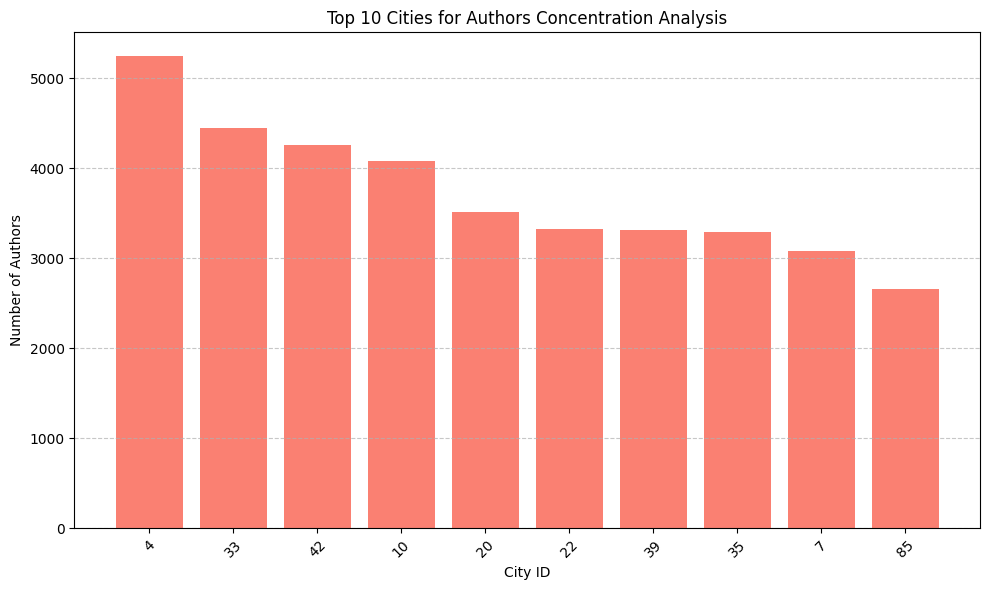

In [5]:
import matplotlib.pyplot as plt

#Count the number of authors in each city
city_author_count = author_df['City_where_the_author_is_located'].value_counts().head(10)  # Top 10

plt.figure(figsize=(10, 6))
bars = plt.bar(range(len(city_author_count)), city_author_count.values, color='salmon')

plt.xticks(ticks=range(len(city_author_count)), labels=[str(int(x)) for x in city_author_count.index], rotation=45)

plt.title('Top 10 Cities for Authors Concentration Analysis')
plt.xlabel('City ID')
plt.ylabel('Number of Authors')
plt.tight_layout()
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()



2.3 Author browsing history

In [6]:
bins = [0, 1, 5, 10, 20, 50, 2648]
data = pd.cut(author_df['Total_views'], bins, right=True,labels=[f'({bins[x]},{bins[x+1]}]' for x in range(len(bins)-1)]).value_counts().reset_index().values.tolist()
pie_chart('Proportion of authors with different views', data).render_notebook()

In [7]:
temp = author_df['Total_views'].sort_values(ascending=False).reset_index().cumsum()['Total_views'].reset_index()
temp = temp/temp.max()
temp['index'] = temp['index'].apply(lambda x: format(x, '.2%'))
data = temp[temp['Total_views']<0.90].values.tolist()

line_chart('Proportion of cumulative views by author', data).render_notebook()

2.4 Author likes status

In [8]:
bins = [-1, 0, 1, 36]
labels = [f'({bins[x]},{bins[x+1]}]' for x in range(len(bins)-1)]
data = (pd.cut(author_df['Total_likes'], bins=bins, right=True, labels=labels)
         .value_counts()
         .rename_axis(None)  #Clear index name
         .reset_index()      #Column name changed to 'index' and 0
         .sort_values(by='index')  #Sort by correct column names
         .values.tolist())
pie_chart('Proportion of authors with different likes', data).render_notebook()

In [9]:
temp = author_df['Total_likes'].sort_values(ascending=False).reset_index().cumsum()['Total_likes'].reset_index()
temp = temp/temp.max()
temp['index'] = temp['index'].apply(lambda x: format(x, '.2%'))
data = temp[temp['Total_likes']<0.999999999999999999].values.tolist()

line_chart('Accumulated likes of the author', data).render_notebook()

In [10]:
_ = temp['Total_likes'].tolist()
for j in range(10):
    j /= 10
    for i in _:
        if i>=j:
            flag = i
            break
    c = _.index(flag)/len(_)
    print(f'{c:4.1%} of the authors obtained {j:3.0%} likes')

0.0% of the authors obtained  0% likes
0.1% of the authors obtained 10% likes
0.2% of the authors obtained 20% likes
0.4% of the authors obtained 30% likes
0.7% of the authors obtained 40% likes
1.1% of the authors obtained 50% likes
1.8% of the authors obtained 60% likes
2.6% of the authors obtained 70% likes
3.4% of the authors obtained 80% likes
4.2% of the authors obtained 90% likes


2.5 The number of cities visited by the author

In [11]:
bins = [0, 1, 2, 10, 20]
data = pd.cut(author_df['Number_of_cities_visited'], bins, right=True,labels=[f'({bins[x]},{bins[x+1]}]' for x in range(len(bins)-1)]).value_counts().reset_index().values.tolist()
pie_chart('Distribution of the number of cities visited by the author', data).render_notebook()

3. Analysis result

From the distribution point of view, the overall user play of Tiktok is very consistent with the Pareto distribution, and a few producers attract most of the traffic of the whole platform. The top 20% of video creators account for over 80% of the platform's traffic, and cultivating or discovering existing good video creators is the key to maintaining traffic in the future.